In [1]:
using Pkg

In [2]:
ENV["PYTHON"] = "/home/tung/anaconda3/envs/celldancer/bin/python3"

"/home/tung/anaconda3/envs/celldancer/bin/python3"

In [3]:
Pkg.build("PyCall")

    Building Conda ─→ `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/b19db3927f0db4151cb86d073689f2428e524576/build.log`
    Building PyCall → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/9816a3826b0ebf49ab4926e2b18842ad8b5c8f04/build.log`


In [4]:
using JuloVelo
using Plots

In [5]:
adata = read_adata("data/JuloVelo_pre.h5ad")

AnnData object 3653 ✕ 2000

In [6]:
adata.uns["iroot"] = 8

8

In [7]:
normalize(adata)

AnnData object 3653 ✕ 2000

In [8]:
filter_and_gene_kinetics_predetermination(adata)

[ Info: 1069 genes are filtered due to low correlation between norm_u and norm_s
[ Info: See adata.var[!, "bad_correlation_genes"] for details
[ Info: 26 genes are filtered due to bad kinetics
[ Info: See adata.var[!, "bad_kinetics_genes"] for details
[ Info: 905 genes are used to infer velocity
[ Info: See adata.var[!, "train_genes"] for details


AnnData object 3653 ✕ 2000

In [9]:
reshape_data(adata)

[ Info: Data is reshaped to (2, 3653, 905)


AnnData object 3653 ✕ 2000

In [10]:
Kinetics = build_velocity_model(adata)

[ Info: Successfully initialize velocity model


Chain(
  SpatialDense(2 => 100, depth = 905, leakyrelu),  # 271_500 parameters
  SpatialDense(100 => 100, depth = 905, leakyrelu),  # 9_140_500 parameters
  SpatialDense(100 => 3, depth = 905, σ),  # 274_215 parameters
)                   # Total: 6 arrays, 9_686_215 parameters, 36.950 MiB.

In [11]:
density_sampling(adata)

[ Info: Sample 2400 cells


AnnData object 3653 ✕ 2000

In [12]:
train(adata, Kinetics)

[ Info: Training on gpu
[ Info: Training with Adam Optimizer
[ Info: TensorBoard logging at "/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/Mouse_E18/GEX/saves/"
[ Info: Start training


Epoch: 0  Train: (cos_loss = 81444.766f0, penalty = 3258.7285f0, AvgMeanCos = 0.9625f0)
Epoch: 1  Train: (cos_loss = 80482.664f0, penalty = 3258.5398f0, AvgMeanCos = 0.9629f0)
Epoch: 2  Train: (cos_loss = 79630.695f0, penalty = 3258.3518f0, AvgMeanCos = 0.9633f0)
Epoch: 3  Train: (cos_loss = 78874.266f0, penalty = 3258.163f0, AvgMeanCos = 0.9637f0)
Epoch: 4  Train: (cos_loss = 78174.75f0, penalty = 3257.9734f0, AvgMeanCos = 0.964f0)
Epoch: 5  Train: (cos_loss = 77513.24f0, penalty = 3257.7837f0, AvgMeanCos = 0.9643f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 6  Train: (cos_loss = 76873.03f0, penalty = 3257.5935f0, AvgMeanCos = 0.9646f0)
Epoch: 7  Train: (cos_loss = 76236.266f0, penalty = 3257.4028f0, AvgMeanCos = 0.9649f0)
Epoch: 8  Train: (cos_loss = 75616.02f0, penalty = 3257.212f0, AvgMeanCos = 0.9652f0)
Epoch: 9  Train: (cos_loss = 75003.26f0, penalty = 3257.0193f0, AvgMeanCos = 0.9655f0)
Epoch: 10  Train: (cos_loss = 74399.05f0, penalty = 3256.8267f0, AvgMeanCos = 0.9657f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 11  Train: (cos_loss = 73810.14f0, penalty = 3256.633f0, AvgMeanCos = 0.966f0)
Epoch: 12  Train: (cos_loss = 73241.016f0, penalty = 3256.4392f0, AvgMeanCos = 0.9663f0)
Epoch: 13  Train: (cos_loss = 72698.19f0, penalty = 3256.2446f0, AvgMeanCos = 0.9665f0)
Epoch: 14  Train: (cos_loss = 72179.11f0, penalty = 3256.0488f0, AvgMeanCos = 0.9668f0)
Epoch: 15  Train: (cos_loss = 71676.94f0, penalty = 3255.8523f0, AvgMeanCos = 0.967f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 16  Train: (cos_loss = 71199.69f0, penalty = 3255.654f0, AvgMeanCos = 0.9672f0)
Epoch: 17  Train: (cos_loss = 70740.86f0, penalty = 3255.4539f0, AvgMeanCos = 0.9674f0)
Epoch: 18  Train: (cos_loss = 70302.18f0, penalty = 3255.2527f0, AvgMeanCos = 0.9676f0)
Epoch: 19  Train: (cos_loss = 69902.22f0, penalty = 3255.05f0, AvgMeanCos = 0.9678f0)
Epoch: 20  Train: (cos_loss = 69526.7f0, penalty = 3254.8464f0, AvgMeanCos = 0.968f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 21  Train: (cos_loss = 69178.05f0, penalty = 3254.6409f0, AvgMeanCos = 0.9682f0)
Epoch: 22  Train: (cos_loss = 68859.7f0, penalty = 3254.434f0, AvgMeanCos = 0.9683f0)
Epoch: 23  Train: (cos_loss = 68555.4f0, penalty = 3254.2256f0, AvgMeanCos = 0.9684f0)
Epoch: 24  Train: (cos_loss = 68264.8f0, penalty = 3254.0156f0, AvgMeanCos = 0.9686f0)
Epoch: 25  Train: (cos_loss = 67981.875f0, penalty = 3253.8042f0, AvgMeanCos = 0.9687f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 26  Train: (cos_loss = 67715.05f0, penalty = 3253.5918f0, AvgMeanCos = 0.9688f0)
Epoch: 27  Train: (cos_loss = 67457.695f0, penalty = 3253.3777f0, AvgMeanCos = 0.9689f0)
Epoch: 28  Train: (cos_loss = 67218.125f0, penalty = 3253.1628f0, AvgMeanCos = 0.9691f0)
Epoch: 29  Train: (cos_loss = 66988.69f0, penalty = 3252.9473f0, AvgMeanCos = 0.9692f0)
Epoch: 30  Train: (cos_loss = 66769.26f0, penalty = 3252.7312f0, AvgMeanCos = 0.9693f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 31  Train: (cos_loss = 66568.67f0, penalty = 3252.515f0, AvgMeanCos = 0.9694f0)
Epoch: 32  Train: (cos_loss = 66372.36f0, penalty = 3252.298f0, AvgMeanCos = 0.9694f0)
Epoch: 33  Train: (cos_loss = 66184.47f0, penalty = 3252.0806f0, AvgMeanCos = 0.9695f0)
Epoch: 34  Train: (cos_loss = 66003.95f0, penalty = 3251.8625f0, AvgMeanCos = 0.9696f0)
Epoch: 35  Train: (cos_loss = 65830.58f0, penalty = 3251.6438f0, AvgMeanCos = 0.9697f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 36  Train: (cos_loss = 65662.71f0, penalty = 3251.4246f0, AvgMeanCos = 0.9698f0)
Epoch: 37  Train: (cos_loss = 65501.28f0, penalty = 3251.2043f0, AvgMeanCos = 0.9698f0)
Epoch: 38  Train: (cos_loss = 65349.09f0, penalty = 3250.9834f0, AvgMeanCos = 0.9699f0)
Epoch: 39  Train: (cos_loss = 65198.24f0, penalty = 3250.7612f0, AvgMeanCos = 0.97f0)
Epoch: 40  Train: (cos_loss = 65048.54f0, penalty = 3250.538f0, AvgMeanCos = 0.9701f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 41  Train: (cos_loss = 64903.71f0, penalty = 3250.3145f0, AvgMeanCos = 0.9701f0)
Epoch: 42  Train: (cos_loss = 64767.87f0, penalty = 3250.0903f0, AvgMeanCos = 0.9702f0)
Epoch: 43  Train: (cos_loss = 64634.625f0, penalty = 3249.865f0, AvgMeanCos = 0.9702f0)
Epoch: 44  Train: (cos_loss = 64505.492f0, penalty = 3249.6392f0, AvgMeanCos = 0.9703f0)
Epoch: 45  Train: (cos_loss = 64378.688f0, penalty = 3249.413f0, AvgMeanCos = 0.9704f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 46  Train: (cos_loss = 64265.336f0, penalty = 3249.1868f0, AvgMeanCos = 0.9704f0)
Epoch: 47  Train: (cos_loss = 64151.86f0, penalty = 3248.96f0, AvgMeanCos = 0.9705f0)
Epoch: 48  Train: (cos_loss = 64041.35f0, penalty = 3248.7324f0, AvgMeanCos = 0.9705f0)
Epoch: 49  Train: (cos_loss = 63938.344f0, penalty = 3248.5044f0, AvgMeanCos = 0.9706f0)
Epoch: 50  Train: (cos_loss = 63836.13f0, penalty = 3248.2754f0, AvgMeanCos = 0.9706f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 51  Train: (cos_loss = 63742.215f0, penalty = 3248.0464f0, AvgMeanCos = 0.9707f0)
Epoch: 52  Train: (cos_loss = 63646.055f0, penalty = 3247.8164f0, AvgMeanCos = 0.9707f0)
Epoch: 53  Train: (cos_loss = 63549.703f0, penalty = 3247.5857f0, AvgMeanCos = 0.9707f0)
Epoch: 54  Train: (cos_loss = 63455.656f0, penalty = 3247.3542f0, AvgMeanCos = 0.9708f0)
Epoch: 55  Train: (cos_loss = 63371.477f0, penalty = 3247.122f0, AvgMeanCos = 0.9708f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 56  Train: (cos_loss = 63287.41f0, penalty = 3246.89f0, AvgMeanCos = 0.9709f0)
Epoch: 57  Train: (cos_loss = 63204.49f0, penalty = 3246.6572f0, AvgMeanCos = 0.9709f0)
Epoch: 58  Train: (cos_loss = 63123.477f0, penalty = 3246.4233f0, AvgMeanCos = 0.9709f0)
Epoch: 59  Train: (cos_loss = 63042.156f0, penalty = 3246.189f0, AvgMeanCos = 0.971f0)
Epoch: 60  Train: (cos_loss = 62965.664f0, penalty = 3245.954f0, AvgMeanCos = 0.971f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 61  Train: (cos_loss = 62894.895f0, penalty = 3245.7185f0, AvgMeanCos = 0.971f0)
Epoch: 62  Train: (cos_loss = 62823.43f0, penalty = 3245.4824f0, AvgMeanCos = 0.9711f0)
Epoch: 63  Train: (cos_loss = 62750.938f0, penalty = 3245.2463f0, AvgMeanCos = 0.9711f0)
Epoch: 64  Train: (cos_loss = 62679.266f0, penalty = 3245.0098f0, AvgMeanCos = 0.9711f0)
Epoch: 65  Train: (cos_loss = 62611.336f0, penalty = 3244.7722f0, AvgMeanCos = 0.9712f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 66  Train: (cos_loss = 62545.832f0, penalty = 3244.5347f0, AvgMeanCos = 0.9712f0)
Epoch: 67  Train: (cos_loss = 62483.496f0, penalty = 3244.2964f0, AvgMeanCos = 0.9712f0)
Epoch: 68  Train: (cos_loss = 62424.773f0, penalty = 3244.0579f0, AvgMeanCos = 0.9713f0)
Epoch: 69  Train: (cos_loss = 62370.965f0, penalty = 3243.8186f0, AvgMeanCos = 0.9713f0)
Epoch: 70  Train: (cos_loss = 62309.523f0, penalty = 3243.5793f0, AvgMeanCos = 0.9713f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 71  Train: (cos_loss = 62247.027f0, penalty = 3243.34f0, AvgMeanCos = 0.9713f0)
Epoch: 72  Train: (cos_loss = 62184.258f0, penalty = 3243.1003f0, AvgMeanCos = 0.9714f0)
Epoch: 73  Train: (cos_loss = 62125.652f0, penalty = 3242.8604f0, AvgMeanCos = 0.9714f0)
Epoch: 74  Train: (cos_loss = 62071.31f0, penalty = 3242.6196f0, AvgMeanCos = 0.9714f0)
Epoch: 75  Train: (cos_loss = 62022.008f0, penalty = 3242.3787f0, AvgMeanCos = 0.9714f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 76  Train: (cos_loss = 61967.2f0, penalty = 3242.1375f0, AvgMeanCos = 0.9715f0)
Epoch: 77  Train: (cos_loss = 61920.082f0, penalty = 3241.8955f0, AvgMeanCos = 0.9715f0)
Epoch: 78  Train: (cos_loss = 61870.24f0, penalty = 3241.6536f0, AvgMeanCos = 0.9715f0)
Epoch: 79  Train: (cos_loss = 61823.25f0, penalty = 3241.4106f0, AvgMeanCos = 0.9715f0)
Epoch: 80  Train: (cos_loss = 61777.562f0, penalty = 3241.1682f0, AvgMeanCos = 0.9716f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 81  Train: (cos_loss = 61731.09f0, penalty = 3240.925f0, AvgMeanCos = 0.9716f0)
Epoch: 82  Train: (cos_loss = 61682.668f0, penalty = 3240.6821f0, AvgMeanCos = 0.9716f0)
Epoch: 83  Train: (cos_loss = 61634.324f0, penalty = 3240.439f0, AvgMeanCos = 0.9716f0)
Epoch: 84  Train: (cos_loss = 61590.195f0, penalty = 3240.195f0, AvgMeanCos = 0.9716f0)
Epoch: 85  Train: (cos_loss = 61546.785f0, penalty = 3239.9521f0, AvgMeanCos = 0.9717f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 86  Train: (cos_loss = 61501.004f0, penalty = 3239.7085f0, AvgMeanCos = 0.9717f0)
Epoch: 87  Train: (cos_loss = 61458.453f0, penalty = 3239.4646f0, AvgMeanCos = 0.9717f0)
Epoch: 88  Train: (cos_loss = 61416.47f0, penalty = 3239.2207f0, AvgMeanCos = 0.9717f0)
Epoch: 89  Train: (cos_loss = 61371.258f0, penalty = 3238.9766f0, AvgMeanCos = 0.9717f0)
Epoch: 90  Train: (cos_loss = 61331.508f0, penalty = 3238.7324f0, AvgMeanCos = 0.9718f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 91  Train: (cos_loss = 61291.016f0, penalty = 3238.4885f0, AvgMeanCos = 0.9718f0)
Epoch: 92  Train: (cos_loss = 61251.867f0, penalty = 3238.244f0, AvgMeanCos = 0.9718f0)
Epoch: 93  Train: (cos_loss = 61211.355f0, penalty = 3237.9993f0, AvgMeanCos = 0.9718f0)
Epoch: 94  Train: (cos_loss = 61174.414f0, penalty = 3237.7544f0, AvgMeanCos = 0.9718f0)
Epoch: 95  Train: (cos_loss = 61136.15f0, penalty = 3237.509f0, AvgMeanCos = 0.9719f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 96  Train: (cos_loss = 61097.832f0, penalty = 3237.2644f0, AvgMeanCos = 0.9719f0)
Epoch: 97  Train: (cos_loss = 61062.137f0, penalty = 3237.0198f0, AvgMeanCos = 0.9719f0)
Epoch: 98  Train: (cos_loss = 61028.098f0, penalty = 3236.7747f0, AvgMeanCos = 0.9719f0)
Epoch: 99  Train: (cos_loss = 60990.855f0, penalty = 3236.5295f0, AvgMeanCos = 0.9719f0)
Epoch: 100  Train: (cos_loss = 60956.723f0, penalty = 3236.2842f0, AvgMeanCos = 0.9719f0)


[ Info: Model is saved in saves/Kinetics.bson


Chain(
  SpatialDense(2 => 100, depth = 905, leakyrelu),  # 271_500 parameters
  SpatialDense(100 => 100, depth = 905, leakyrelu),  # 9_140_500 parameters
  SpatialDense(100 => 3, depth = 905, σ),  # 274_215 parameters
)                   # Total: 6 arrays, 9_686_215 parameters, 36.950 MiB.

In [13]:
velocity_estimation(adata, Kinetics);

[ Info: Velocity saved in adata.uns["velocity"]
[ Info: kinetics saved in adata.uns["kinetics"]


In [14]:
compute_cell_velocity(adata);

In [15]:
estimate_pseudotime(adata, 2, n_repeat = 3; celltype = "celltype");

[ Info: Start estimate pseudotime, it may take a long time.
Generating Trajectories: 100%|█████████| 10956/10956 [00:02<00:00, 5275.19it/s]


Pseudo random number generator seeds are set to:  [0, 1, 2]
There are 2 clusters.
[0 1]
--- 10.514456987380981 seconds ---


In [16]:
write_adata(adata, filename = "data/JuloVelo")

# Plot figure

## Gene kinetics

In [17]:
palattes = Dict(
    "Deeper Layer"=>"#1f77b4",
    "Ependymal cells"=>"#ff7f0e",
    "IPC"=>"#2ca02c",
    "RG, Astro, OPC"=>"#d62728",
    "Subplate"=>"#9467bd",
    "Upper Layer"=>"#8c564b",
    "V-SVZ"=>"#e377c2"
)

Dict{String, String} with 7 entries:
  "Deeper Layer"    => "#1f77b4"
  "IPC"             => "#2ca02c"
  "RG, Astro, OPC"  => "#d62728"
  "Subplate"        => "#9467bd"
  "V-SVZ"           => "#e377c2"
  "Ependymal cells" => "#ff7f0e"
  "Upper Layer"     => "#8c564b"

In [18]:
function gene_plot(x, x̂; part = 20)
    x_range = Array(range(0, 1, part))
    y_range = Array(range(0, 1, part))
    
    arrow_vector = Array{Float32}(undef, 0, 2)
    point_vector = Array{Float32}(undef, 0, 2)
    
    for i in 1:part - 1
        for j in 1:part - 1
            index = intersect(findall(k -> (k .>= x_range[i]) & (k .<= x_range[i + 1]), x[2, :]), 
            findall(k -> (k .>= y_range[j]) & (k .<= y_range[j + 1]), x[1, :]))
            
            if length(index) > 0
                selected = x̂[:, index]
            else
                continue
            end
            
            selected_vector = sum(selected, dims = 2) ./ size(selected, 2)
            scale = maximum(abs, selected_vector) / (x_range[i + 1] - x_range[i])
            selected_vector = selected_vector ./ scale
            #println(selected_vector)
            xcenter = (x_range[i + 1] + x_range[i]) / 2
            ycenter = (y_range[j + 1] + y_range[j]) / 2
            xarrow = selected_vector[2]
            yarrow = selected_vector[1]
            
            arrow_vector = vcat(arrow_vector, vec([xarrow, yarrow])')
            point_vector = vcat(point_vector, vec([xcenter, ycenter])')
        end
    end
    
    return arrow_vector, point_vector
end

gene_plot (generic function with 1 method)

In [19]:
theme(:vibrant, framestyle = :zerolines, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

In [20]:
GR.setarrowsize(0.5)

In [21]:
X = adata.uns["X"];
velocity = adata.uns["velocity"]
genes = adata.var_names[adata.var[!, "train_genes"]]
celltype = adata.obs[!, "celltype"]
labels = sort(unique(celltype));

In [22]:
idx = findfirst(x -> x == "Eomes", genes) # 

879

In [23]:
arrow_vector, point_vector = gene_plot(X[:, :, idx], velocity[:, :, idx])

([-0.05263157894736842 -0.012690239090719408; 0.020672068739478237 -0.05263157894736842; … ; -0.0036165615605423087 -0.05263157894736836; -0.01985050052569652 -0.05263157894736847], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9210526315789473 0.868421052631579; 0.9736842105263157 0.7105263157894737])

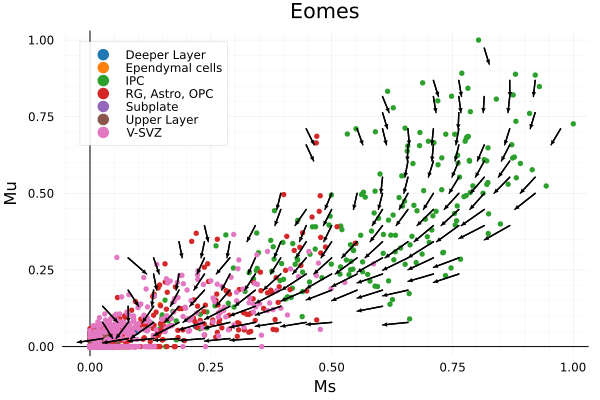

In [24]:
p1 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx], X[1, celltype .== label, idx], label = label, xlabel = "Ms", ylabel = "Mu", color = palattes[label], title = genes[idx])
end
quiver!(point_vector[:, 1], point_vector[:, 2], quiver = (arrow_vector[:, 1], arrow_vector[:, 2]), arrow = arrow(:closed), color = "#000000")

In [25]:
idx2 = findfirst(x -> x == "Gria2", genes)

523

In [26]:
arrow_vector1, point_vector1 = gene_plot(X[:, :, idx2], velocity[:, :, idx2])

([0.0026084278688813536 0.05263157894736842; 0.019057882224371953 0.05263157894736842; … ; -0.0008566737827587082 -0.05263157894736837; -0.0125675804846881 -0.052631578947368474], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9210526315789473 0.9210526315789473; 0.9736842105263157 0.8157894736842105])

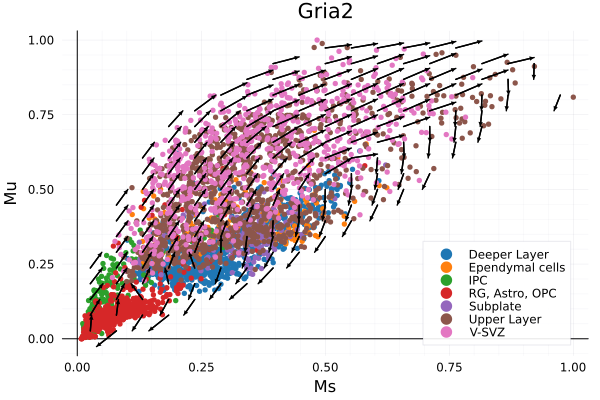

In [27]:
p2 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx2], X[1, celltype .== label, idx2], label = label, xlabel = "Ms", ylabel = "Mu", color = palattes[label], title = genes[idx2])
end
quiver!(point_vector1[:, 1], point_vector1[:, 2], quiver = (arrow_vector1[:, 1], arrow_vector1[:, 2]), arrow = arrow(:closed), color = "#000000")

In [28]:
idx3 = findfirst(x -> x == "Tle4", genes)

408

In [29]:
arrow_vector2, point_vector2 = gene_plot(X[:, :, idx3], velocity[:, :, idx3])

([0.00423673316093907 0.05263157894736842; 0.0181945592376757 0.05263157894736842; … ; -0.011683202423351618 -0.052631578947368474; -0.005469862030633561 -0.052631578947368474], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.8157894736842105; 0.9736842105263157 0.868421052631579])

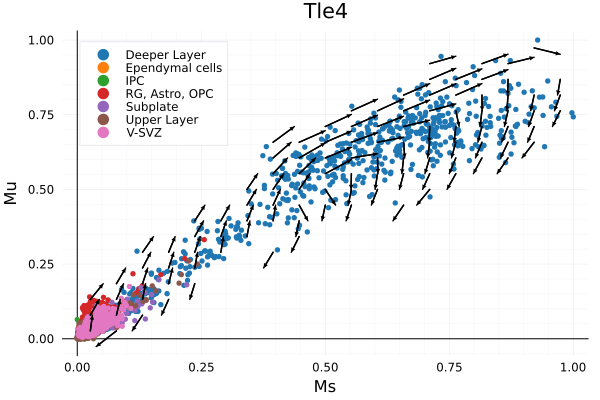

In [30]:
p3 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx3], X[1, celltype .== label, idx3], label = label, xlabel = "Ms", ylabel = "Mu", color = palattes[label], title = genes[idx3])
end
quiver!(point_vector2[:, 1], point_vector2[:, 2], quiver = (arrow_vector2[:, 1], arrow_vector2[:, 2]), arrow = arrow(:closed), color = "#000000")

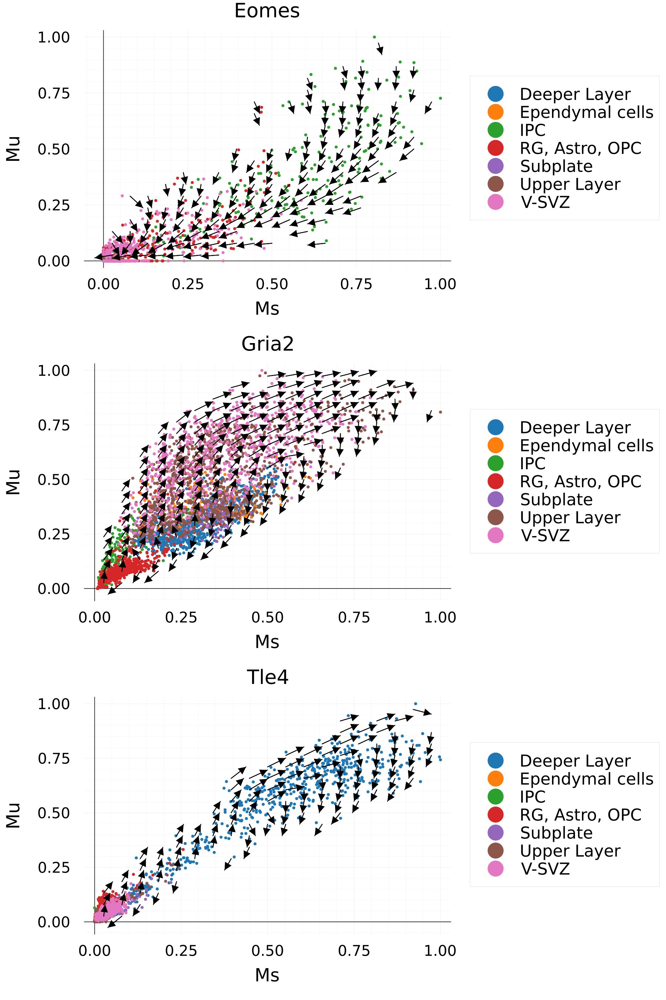

In [31]:
p = plot(p1, p2, p3, layout = (3, 1), size = (1200, 1800), dpi = 150, left_margins = 1.3Plots.cm, bottom_margins = 0.5Plots.cm, 
    legendfontsize = 20, xtickfontsize = 18, ytickfontsize = 18, xguidefontsize = 22, yguidefontsize = 22, titlefontsize = 24, legend = :outerright)

In [32]:
savefig(p, "figure/JuloVelo_velocity_vector.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/Mouse_E18/GEX/figure/JuloVelo_velocity_vector.png"

## Kinetics embedding

In [33]:
kinetics_embedding(adata; basis = "umap");

In [34]:
embedding = adata.obsm["kinetics_umap"];

In [35]:
celltype = adata.obs[!, "celltype"]
labels = sort(unique(celltype))

7-element Vector{String}:
 "Deeper Layer"
 "Ependymal cells"
 "IPC"
 "RG, Astro, OPC"
 "Subplate"
 "Upper Layer"
 "V-SVZ"

In [36]:
theme(:vibrant, framestyle = :axes, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

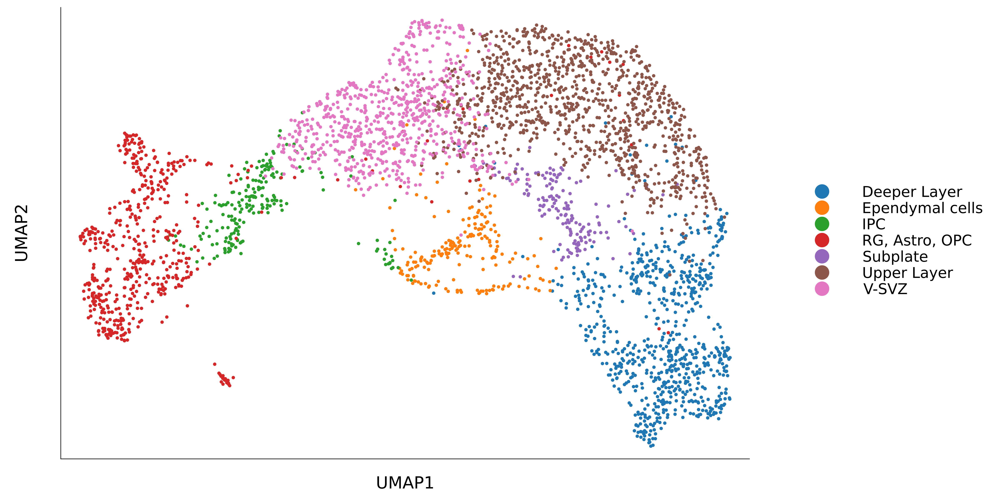

In [37]:
p = scatter(size = (1600, 800), fg_legend = :transparent, left_margin = 1.8Plots.cm, bottom_margin = 1.0Plots.cm, dpi = 300) #
for label in labels
    scatter!(embedding[celltype .== label, 1], embedding[celltype .== label, 2], label = label, legend=:outerright, legendfontsize = 16, color = palattes[label]
        , xlabel = "UMAP1", ylabel = "UMAP2", xtick = nothing, yticks = nothing, xguidefontsize = 18, yguidefontsize = 18)
end
p

In [38]:
savefig(p, "figure/mouse_brain_kinetic_embedding.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/Mouse_E18/GEX/figure/mouse_brain_kinetic_embedding.png"